In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov9-main

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1FsxtjdRhKCSS4b319zT5rcL3Dd5sOLs5/yolov9-main


In [ ]:
import cv2
import numpy as np
instance_path = "datasets/PhenoBench/train/plant_instances/05-26_00193_P0034119.png"
semantic_path = "datasets/PhenoBench/train/semantics/05-26_00193_P0034119.png"

instance_mask = cv2.imread(instance_path, cv2.IMREAD_UNCHANGED)
semantic_mask = cv2.imread(semantic_path, cv2.IMREAD_UNCHANGED)

print("Instance mask shape:", instance_mask.shape, "Unique vals:", np.unique(instance_mask))
print("Semantic mask shape:", semantic_mask.shape, "Unique vals:", np.unique(semantic_mask))

if semantic_mask.ndim == 3:
    print("Semantic mask channels:", semantic_mask.shape[2])
    semantic_mask_gray = semantic_mask[:, :, 0]
    print("Unique vals in semantic_mask_gray:", np.unique(semantic_mask_gray))

Instance mask shape: (1024, 1024) Unique vals: [   0  229  235  236  237  238  315  335  336  337  338  342  517 1263
 1265]
Semantic mask shape: (1024, 1024) Unique vals: [0 1 2 3]


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels | wc -l

1407
1407


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels | wc -l

772
772


In [ ]:
import os
import json
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

# === User config ===
output_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations"
os.makedirs(output_dir, exist_ok=True)

# Base image and label directories
image_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
}
label_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels"
}

class_names = ["crop", "weed"]

def convert_to_coco(split):
    image_dir = image_dirs[split]
    label_dir = label_dirs[split]

    image_paths = sorted(glob(os.path.join(image_dir, "*.png")) + glob(os.path.join(image_dir, "*.jpg")))
    images = []
    annotations = []
    ann_id = 0

    for img_id, img_path in enumerate(tqdm(image_paths, desc=f"[{split}] Processing images")):
        filename = os.path.basename(img_path)
        name = os.path.splitext(filename)[0]
        label_path = os.path.join(label_dir, f"{name}.txt")

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Image load failed: {img_path}")
            continue
        height, width = img.shape[:2]

        images.append({
            "id": img_id,
            "file_name": filename,
            "width": width,
            "height": height
        })

        if not os.path.exists(label_path):
            continue

        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 7:
                continue

            try:
                cls_id = int(parts[0])
                coords = list(map(float, parts[1:]))

                if len(coords) % 2 != 0:
                    continue

                coords_np = np.array(coords).reshape(-1, 2)
                coords_np = np.clip(coords_np, 0, 1)
                abs_coords = (coords_np * np.array([width, height])).astype(np.float32)
                abs_coords_flat = abs_coords.flatten().tolist()

                if len(abs_coords) < 3:
                    continue

                x_min, y_min = abs_coords.min(axis=0)
                x_max, y_max = abs_coords.max(axis=0)
                bbox = [float(x_min), float(y_min), float(x_max - x_min), float(y_max - y_min)]
                area = float((x_max - x_min) * (y_max - y_min))

                annotations.append({
                    "id": ann_id,
                    "image_id": img_id,
                    "category_id": cls_id,
                    "segmentation": [abs_coords_flat],
                    "area": area,
                    "bbox": bbox,
                    "iscrowd": 0
                })
                ann_id += 1
            except Exception as e:
                print(f"❌ Error in {label_path}: {e}")
                continue

    coco_dict = {
        "info": {
            "description": f"PhenoBench {split} in COCO instance format"
        },
        "licenses": [],
        "images": images,
        "annotations": annotations,
        "categories": [
            {"id": i, "name": name, "supercategory": "plant"} for i, name in enumerate(class_names)
        ]
    }

    out_json = os.path.join(output_dir, f"instances_{split}.json")
    with open(out_json, "w") as f:
        json.dump(coco_dict, f)
    print(f"✅ Saved: {out_json} — {len(images)} images, {len(annotations)} instances")

# Run for both splits
convert_to_coco("train")
convert_to_coco("val")

[train] Processing images: 100%|██████████| 1407/1407 [21:03<00:00,  1.11it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json — 1407 images, 23253 instances


[val] Processing images: 100%|██████████| 772/772 [11:15<00:00,  1.14it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json — 772 images, 11874 instances


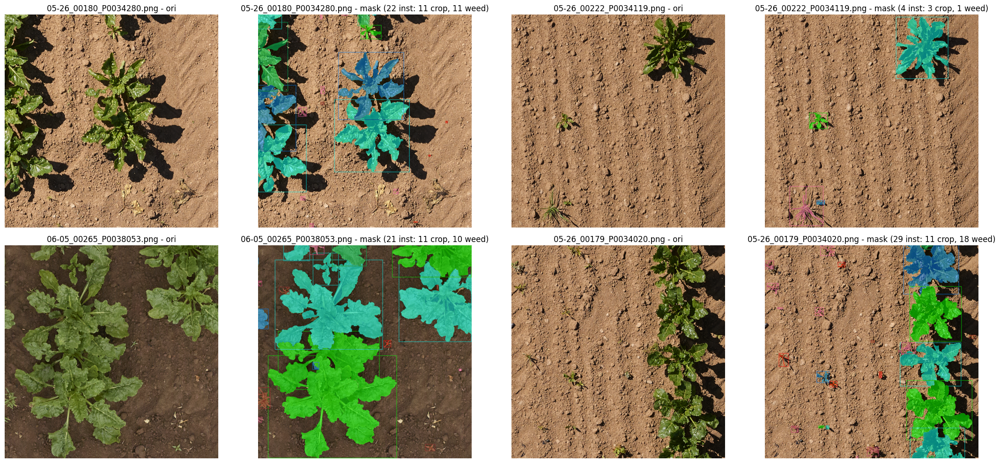

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json"

# --- Colors per class ---
CROP_COLORS = [(0, 255, 0), (0, 255, 255), (0, 128, 255), (0, 200, 100)]
WEED_COLORS = [(255, 0, 0), (255, 100, 180), (165, 42, 42), (200, 50, 120)]

def get_color(cls_id):
    return random.choice(CROP_COLORS if cls_id == 0 else WEED_COLORS)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick random 4 images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()
    h, w = img.shape[:2]

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        seg = ann["segmentation"][0]
        coords = np.array(seg).reshape(-1, 2).astype(np.int32)
        if len(coords) < 3:
            continue

        color = get_color(cls_id)
        cv2.fillPoly(overlay, [coords], color)
        x_min, y_min = coords.min(axis=0)
        x_max, y_max = coords.max(axis=0)
        cv2.rectangle(overlay, (x_min, y_min), (x_max, y_max), color, 2)

    blended = cv2.addWeighted(img, 0.5, overlay, 0.5, 0)
    total = count_crop + count_weed

    row, col = i // 2, (i % 2) * 2
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"{filename} - ori")
    axes[row, col].axis("off")

    axes[row, col + 1].imshow(blended)
    axes[row, col + 1].set_title(f"{filename} - mask ({total} inst: {count_crop} crop, {count_weed} weed)")
    axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()

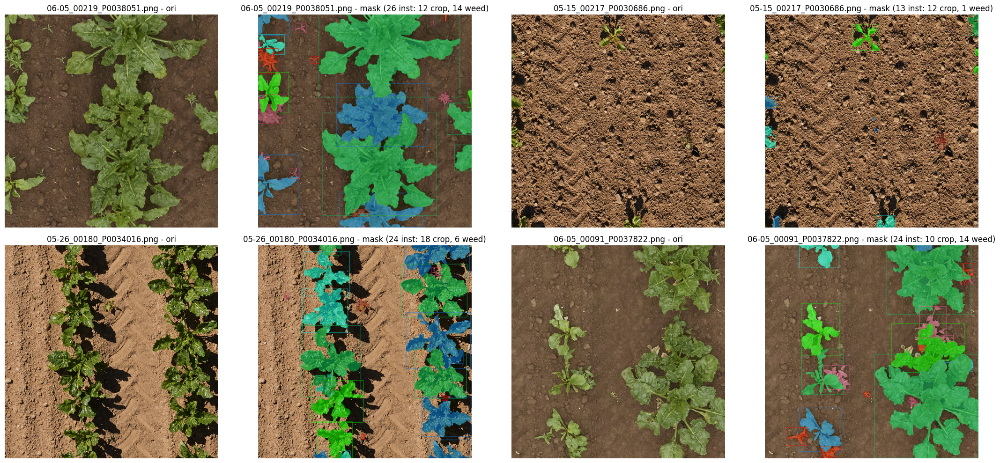

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json"

# --- Colors per class ---
CROP_COLORS = [(0, 255, 0), (0, 255, 255), (0, 128, 255), (0, 200, 100)]
WEED_COLORS = [(255, 0, 0), (255, 100, 180), (165, 42, 42), (200, 50, 120)]

def get_color(cls_id):
    return random.choice(CROP_COLORS if cls_id == 0 else WEED_COLORS)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick random 4 images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()
    h, w = img.shape[:2]

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        seg = ann["segmentation"][0]
        coords = np.array(seg).reshape(-1, 2).astype(np.int32)
        if len(coords) < 3:
            continue

        color = get_color(cls_id)
        cv2.fillPoly(overlay, [coords], color)
        x_min, y_min = coords.min(axis=0)
        x_max, y_max = coords.max(axis=0)
        cv2.rectangle(overlay, (x_min, y_min), (x_max, y_max), color, 2)

    blended = cv2.addWeighted(img, 0.5, overlay, 0.5, 0)
    total = count_crop + count_weed

    row, col = i // 2, (i % 2) * 2
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"{filename} - ori")
    axes[row, col].axis("off")

    axes[row, col + 1].imshow(blended)
    axes[row, col + 1].set_title(f"{filename} - mask ({total} inst: {count_crop} crop, {count_weed} weed)")
    axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# STEP 1: Install compatible PyTorch (2.0.1 + CUDA 11.7)
!pip install torch==2.0.1 torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

# STEP 2: Install OpenMMLab tools
!pip install -U openmim
!mim install "mmengine>=0.7.4"
!mim install "mmcv==2.1.0"

# STEP 3: Clone MMDetection & install
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

In [ ]:
# STEP 4: Final check
!python -c "import torch; import mmcv; import mmdet; print('PyTorch:', torch.__version__); print('MMCV:', mmcv.__version__); print('MMDet:', mmdet.__version__)"

PyTorch: 2.0.1+cu117
MMCV: 2.1.0
MMDet: 3.3.0


In [ ]:
!pip install numpy==1.24.4

In [2]:
!ls mmdetection/configs/condinst/

condinst_pheno.py			       metafile.yml
condinst_r50_fpn_ms-poly-90k_coco_instance.py  README.md


In [ ]:
custom_cfg = """
_base_ = 'condinst_r50_fpn_ms-poly-90k_coco_instance.py'

# Custom classes
dataset_type = 'CocoDataset'
metainfo = dict(classes=('crop', 'weed'))
num_classes = 2

# Paths
data_root = '/content/gdrive/MyDrive/yolov9-main/datasets/'
train_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_train.json'
val_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_val.json'
train_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/train/'
val_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/val/'

# Normalization
img_norm_cfg = dict(mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)

# Pipelines
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='Resize', scale=(512, 512), keep_ratio=False),
    dict(type='Pad', size=(512, 512), pad_val=dict(img=(114, 114, 114))),
    dict(type='LoadAnnotations', with_bbox=True, with_mask=True),
    dict(type='PackDetInputs', meta_keys=('img_id', 'img_path', 'ori_shape', 'img_shape', 'scale_factor'))
]

# Data loader
train_dataloader = dict(
    batch_size=32,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        ann_file=train_ann,
        data_prefix=dict(img=train_img),
        filter_cfg=dict(filter_empty_gt=True, min_size=32),
        pipeline=train_pipeline,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

val_dataloader = dict(
    batch_size=16,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        data_root=data_root,
        ann_file=val_ann,
        data_prefix=dict(img=val_img),
        pipeline=test_pipeline,
        test_mode=True,
        metainfo=dict(classes=('crop', 'weed')),
    )
)

test_dataloader = val_dataloader

# Evaluator
#val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'])
val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox', 'segm'], classwise=True)
test_evaluator = val_evaluator

# Model
#model = dict(bbox_head=dict(num_classes=num_classes))
#model = dict(bbox_head=dict(num_classes=num_classes), test_cfg=dict(score_thr=0.5))

model = dict(
    type='CondInst',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained', checkpoint='torchvision://resnet50')
    ),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5,
        add_extra_convs='on_output',
        relu_before_extra_convs=True,
        start_level=1,
    ),
    bbox_head=dict(
        type='CondInstBboxHead',
        num_classes=2,  # your class count here
        feat_channels=256,
        stacked_convs=4,
        strides=[8, 16, 32, 64, 128],
        loss_cls=dict(type='FocalLoss', use_sigmoid=True, gamma=2.0, alpha=0.25, loss_weight=1.0),
        loss_bbox=dict(type='GIoULoss', loss_weight=1.0),
        loss_centerness=dict(type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.0),
        center_sampling=True,
        centerness_on_reg=True,
        conv_bias=True,
    ),
    mask_head=dict(
        type='CondInstMaskHead',
        num_layers=3,
        feat_channels=8,
        mask_out_stride=4,
        size_of_interest=8,
        max_masks_to_train=300,
        loss_mask=dict(type='DiceLoss', use_sigmoid=True, loss_weight=1.0),
        mask_feature_head=dict(
            type='MaskFeatHead',
            in_channels=256,
            out_channels=8,
            num_stacked_convs=4,
            feat_channels=128,
            norm_cfg=dict(type='BN', requires_grad=True),
            start_level=0,
            end_level=2,
            mask_stride=8,
        ),
    ),
    train_cfg=dict(),
    test_cfg=dict(
        score_thr=0.3,
        nms=dict(type='nms', iou_threshold=0.6),
        max_per_img=100,
        mask_thr=0.3,
        min_bbox_size=0,
        nms_pre=100,
    )
)

# === Trainin
train_cfg = dict(
    type='IterBasedTrainLoop',
    max_iters=880,
    val_interval=44  # ← this controls when evaluation runs
)

val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

# Optimizer
optim_wrapper = dict(
    optimizer=dict(type='SGD', lr=0.01, momentum=0.9, weight_decay=0.0001),
    clip_grad=None
)

# === Scheduler
param_scheduler = [
    dict(type='LinearLR', start_factor=0.1, by_epoch=False, begin=0, end=880),
    dict(type='MultiStepLR', begin=0, end=20, by_epoch=True, milestones=[15, 18], gamma=0.1)
]

# Logging and checkpointing
default_hooks = dict(
    checkpoint=dict(type='CheckpointHook', interval=88, by_epoch=False),
    logger=dict(type='LoggerHook', interval=88),
)

# Output path
work_dir = '/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/condinst_crop_weed'

# Load pretrained COCO model
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/condinst/condinst_r50_fpn_ms-poly-90k_coco_instance/condinst_r50_fpn_ms-poly-90k_coco_instance_20221129_125223-4c186406.pth'
"""

with open('mmdetection/configs/condinst/condinst_pheno.py', 'w') as f:
    f.write(custom_cfg)

In [ ]:
!python mmdetection/tools/train.py \
  mmdetection/configs/condinst/condinst_pheno.py --amp

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 08:43:13 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 949446534
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
!python mmdetection/tools/test.py mmdetection/configs/condinst/condinst_pheno.py mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 10:55:05 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1758010695
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA

In [ ]:
!python mmdetection/tools/test.py \
  mmdetection/configs/condinst/condinst_pheno.py \
  mmdetection/mmdet_outputs/condinst_crop_weed/iter_704.pth \
  --show-dir pheno_seg_exp1

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 11:11:17 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 974614202
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [4]:
import shutil
import os

src = "mmdetection/mmdet_outputs/condinst_crop_weed/20250719_111116/pheno_seg_exp1"
dst = "/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst"

# First copy the folder and its contents
shutil.copytree(src, dst)

'/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst'

In [20]:
!ls mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst | wc -l

772


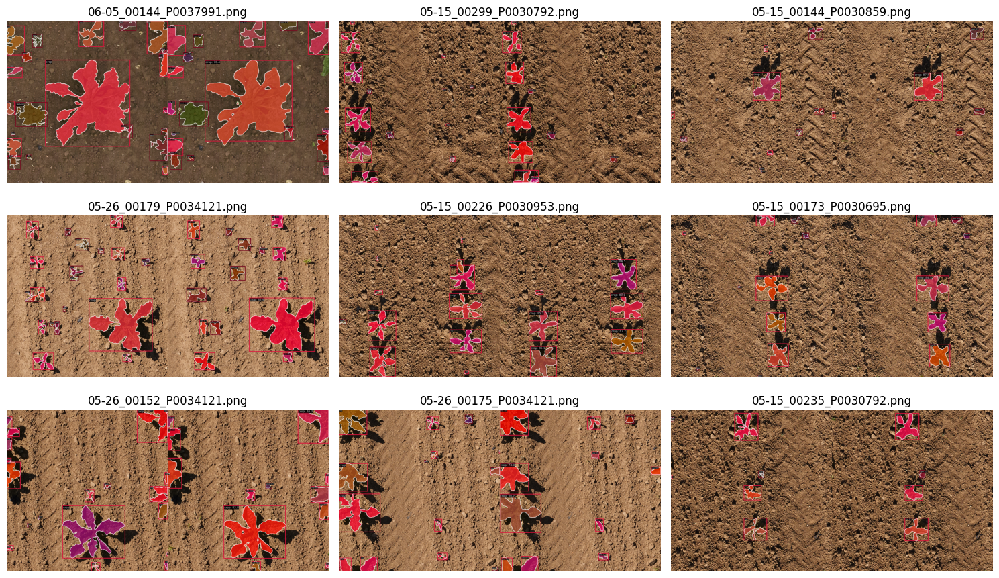

In [21]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from glob import glob

# --- Config ---
results_dir = "mmdetection/mmdet_outputs/condinst_crop_weed/pheno_seg_condinst"
num_images = 9  # Any number

# --- Get image paths ---
image_paths = sorted(glob(os.path.join(results_dir, "*.png")))
sampled_paths = random.sample(image_paths, min(num_images, len(image_paths)))

# --- Plotting ---
cols = 3
rows = (len(sampled_paths) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 3))

# Flatten axes for easy indexing
axes = axes.flatten()

for i, img_path in enumerate(sampled_paths):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].set_title(os.path.basename(img_path))
    axes[i].axis("off")

# Hide unused subplots if any
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()